In [1]:
import os
os.chdir('../../..')
import convokit
from convokit import Corpus, download, TensorDecomposer

In [2]:
corpus = Corpus(download('friends-corpus'))

Dataset already exists at /Users/calebchiam/.convokit/downloads/friends-corpus


In [135]:
corpus.print_summary_stats()

Number of Speakers: 700
Number of Utterances: 64540
Number of Conversations: 3099


In [27]:
main_cast = {'Monica Geller', 'Joey Tribbiani', 'Chandler Bing', 'Phoebe Buffay', 'Ross Geller', 'Rachel Green'}

In [32]:
main_cast & {'Monica Geller'}

{'Monica Geller'}

In [28]:
convo = corpus.random_conversation()

In [30]:
convo.get_speaker_ids()

/Users/calebchiam/Documents/GitHub/Cornell-Conversational-Analysis-Toolkit/convokit/model/conversation.py:119: FutureWarning: speaker.name is deprecated and will be removed in a future release. Use speaker.id instead.


['TRANSCRIPT_NOTE', 'Ross Geller', 'Richard Burke', 'Friend']

In [41]:
ctr = 0
for convo in corpus.iter_conversations():
    if len(set(convo.get_speaker_ids()) & main_cast) >= 4:
         ctr += 1

In [42]:
ctr

866

In [43]:
has_4_main_cast = lambda convo: len(set(convo.get_speaker_ids()) & main_cast) >= 4

In [45]:
for convo in corpus.iter_conversations(has_4_main_cast):


s01_e01_c01
s01_e01_c02
s01_e01_c11
s01_e01_c13
s01_e01_c14
s01_e01_c15
s01_e02_c01
s01_e02_c03
s01_e02_c05
s01_e02_c11
s01_e03_c01
s01_e03_c03
s01_e03_c05
s01_e03_c06
s01_e03_c09
s01_e03_c11
s01_e03_c12
s01_e03_c14
s01_e04_c01
s01_e04_c02
s01_e04_c16
s01_e05_c01
s01_e05_c02
s01_e05_c16
s01_e06_c01
s01_e06_c02
s01_e06_c03
s01_e06_c04
s01_e06_c05
s01_e06_c08
s01_e07_c05
s01_e07_c08
s01_e07_c10
s01_e07_c12
s01_e07_c16
s01_e07_c18
s01_e08_c02
s01_e08_c04
s01_e08_c09
s01_e08_c10
s01_e08_c11
s01_e08_c12
s01_e09_c02
s01_e09_c04
s01_e09_c08
s01_e09_c10
s01_e09_c12
s01_e10_c01
s01_e10_c02
s01_e10_c03
s01_e10_c05
s01_e10_c07
s01_e11_c03
s01_e11_c05
s01_e11_c06
s01_e11_c09
s01_e11_c12
s01_e12_c02
s01_e12_c07
s01_e12_c08
s01_e12_c11
s01_e12_c13
s01_e12_c14
s01_e13_c02
s01_e13_c04
s01_e13_c08
s01_e13_c09
s01_e13_c12
s01_e14_c02
s01_e14_c08
s01_e15_c01
s01_e15_c03
s01_e15_c04
s01_e15_c06
s01_e15_c12
s01_e16_c02
s01_e16_c05
s01_e16_c10
s01_e16_c13
s01_e16_c15
s01_e17_c04
s01_e17_c07
s01_e17_c11
s01_

In [138]:
valid_ids = {convo.id for convo in corpus.iter_conversations(lambda c: c.get_utterance(c.id).speaker.id != '#ALL#')}

In [139]:
len(valid_ids)

3093

In [140]:
corpus.print_summary_stats()

Number of Speakers: 700
Number of Utterances: 64540
Number of Conversations: 3099


In [141]:
corpus = corpus.reindex_conversations(new_convo_roots=valid_ids, preserve_convo_meta=False)

In [142]:
corpus.print_summary_stats()

Number of Speakers: 700
Number of Utterances: 64428
Number of Conversations: 3093


In [144]:
for convo in corpus.iter_conversations():
    if convo.get_utterance(convo.id).speaker.id == 'TRANSCRIPT_NOTE':
        print(convo.id)

In [146]:
for convo in corpus.iter_conversations():
    if not convo.check_integrity(verbose=False):
        print(convo.id)

In [147]:
os.listdir()

['LICENSE.md',
 'diff_from_random.csv',
 'convokit',
 '.DS_Store',
 'requirements.txt',
 'dist',
 'Makefile',
 'website',
 'datasets',
 'tests',
 'README.md',
 'setup.py',
 '.mypy_cache',
 '.gitignore',
 'static',
 'CONTRIBUTING.md',
 'examples',
 '.github',
 'doc',
 '.ipynb_checkpoints',
 'venv-triadmotif',
 'convokit.egg-info',
 'venv',
 '.git',
 'model.tar',
 '.idea']

In [148]:
corpus.dump('friends-filtered', base_path='convokit/tensor_decomposer/experiments')

In [197]:
corpus = Corpus('convokit/tensor_decomposer/experiments/friends-filtered')

In [ ]:
ts_notes = set()
for convo in corpus.iter_conversations():
    to_remove = []
    last_valid_utt = None
    prev_was_note = False
    for utt in convo.iter_utterances():
        if utt.speaker.id == 'TRANSCRIPT_NOTE':
            prev_was_note = True
            to_remove.append(utt.id)
            ts_notes.add(utt.id)
        else:
            if prev_was_note:
                utt.reply_to = last_valid_utt.id
                prev_was_note = False
            last_valid_utt = utt
    for utt_id in to_remove:
        convo._utterance_ids.remove(utt_id)

In [199]:
for convo in corpus.iter_conversations():
    if not convo.check_integrity(verbose=False):
        print(convo.id)

In [201]:
for convo in corpus.iter_conversations():
    convo.initialize_tree_structure()

In [202]:
corpus = corpus.filter_utterances_by(lambda utt: utt.id not in ts_notes)

In [203]:
corpus.print_summary_stats()

Number of Speakers: 699
Number of Utterances: 61229
Number of Conversations: 3093


In [205]:
corpus.dump('friends-filtered', base_path='convokit/tensor_decomposer/experiments')

## ANALYSIS

In [398]:
corpus = Corpus('convokit/tensor_decomposer/experiments/friends-filtered')

In [206]:
main_cast

{'Chandler Bing',
 'Joey Tribbiani',
 'Monica Geller',
 'Phoebe Buffay',
 'Rachel Green',
 'Ross Geller'}

In [399]:
main_cast_list = sorted(list(main_cast))

In [400]:
def get_dicts(utts):
    retval = []
    for utt in utts:
        d = {k: 0 for k in main_cast_list}
        d['other'] = 0
        if utt.speaker.id in main_cast:
            d[utt.speaker.id] = 1
        else:
            d['other'] = 1
        retval.append(d)
    return retval

In [401]:
for utt in corpus.iter_utterances():
    utt.meta['valid'] = False

In [418]:
def annotate_convo(convo, LENGTH):
    utts = list(convo.iter_utterances())
    for idx in range(len(utts)):
        subset = utts[idx: idx+LENGTH]
        if len(subset) < LENGTH: break
        speakers = {utt.speaker.id for utt in subset}
        if len(speakers & main_cast) >= 3:
            ds = get_dicts(subset)
            for i, d in enumerate(ds):
                utts[idx].meta['speaker-dict-{}'.format(i+1)] = d
            utts[idx].meta['valid'] = True

In [419]:
LENGTH = 8

for convo in corpus.iter_conversations():
    annotate_convo(convo, LENGTH)

In [420]:
ctr = 0
for utt in corpus.iter_utterances(lambda utt: utt.meta['valid']):
    ctr += 1
print(ctr)

34817


In [421]:
td = TensorDecomposer(feature_set=['speaker-dict-{}'.format(idx) for idx in range(1, LENGTH+1)], 
                      obj_type="utterance", tensor_func='tensortools-ncp-bcd', rank=50)

In [422]:
td.fit(corpus, selector=lambda utt: utt.meta['valid'])

Constructing tensor...Done.
Decomposing tensor...NCP_BCD: iteration 1, objective 0.9103120440096405, improvement inf.
NCP_BCD: iteration 2, objective 0.8869114089175205, improvement 0.02340063509211998.
NCP_BCD: iteration 3, objective 0.8520331985378602, improvement 0.034878210379660324.
NCP_BCD: iteration 4, objective 0.8118222722504513, improvement 0.040210926287408855.
NCP_BCD: iteration 5, objective 0.7664331963617097, improvement 0.04538907588874164.
NCP_BCD: iteration 6, objective 0.7133830558347699, improvement 0.05305014052693979.
NCP_BCD: iteration 7, objective 0.6627722486386681, improvement 0.05061080719610178.
NCP_BCD: iteration 8, objective 0.6159871480442085, improvement 0.04678510059445962.
NCP_BCD: iteration 9, objective 0.5738074380501281, improvement 0.04217970999408038.
NCP_BCD: iteration 10, objective 0.5351049079309126, improvement 0.03870253011921554.
NCP_BCD: iteration 11, objective 0.49568990982879196, improvement 0.039414998102120624.
NCP_BCD: iteration 12, obj

In [423]:
main_cast_list

['Chandler Bing',
 'Joey Tribbiani',
 'Monica Geller',
 'Phoebe Buffay',
 'Rachel Green',
 'Ross Geller']

/Users/calebchiam/Documents/GitHub/Cornell-Conversational-Analysis-Toolkit/convokit/tensor_decomposer/tensorDecomposer.py:131: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).



Directory already exists. Exiting summarize()


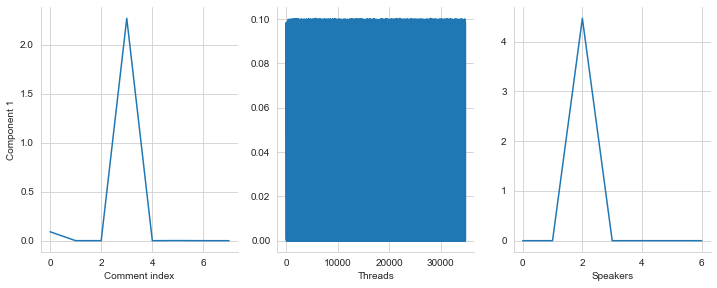

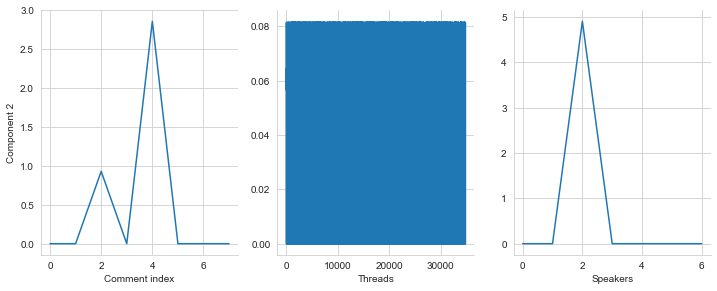

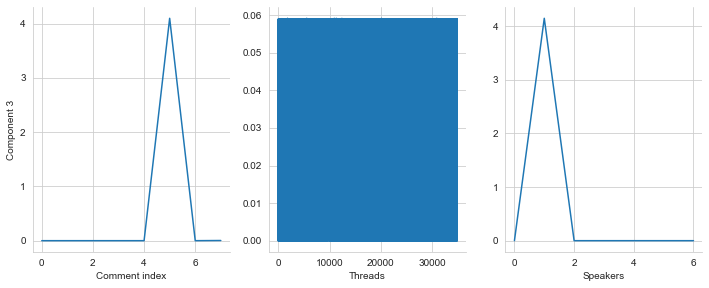

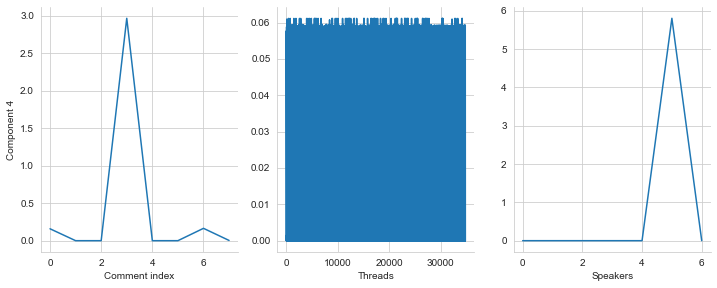

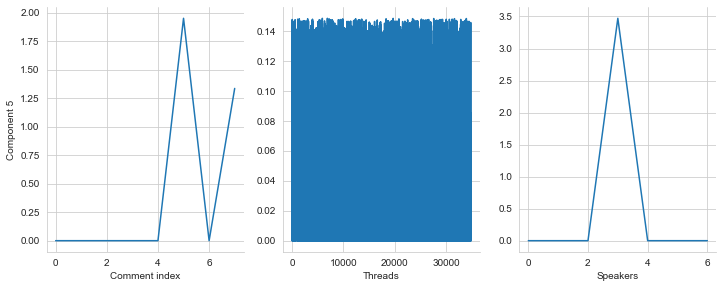

...

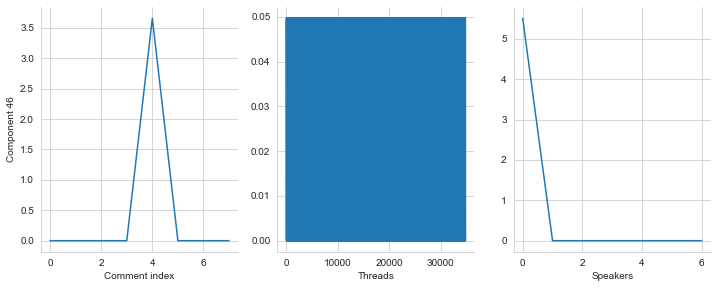

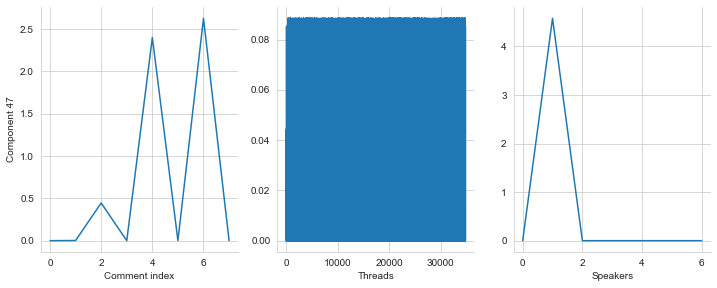

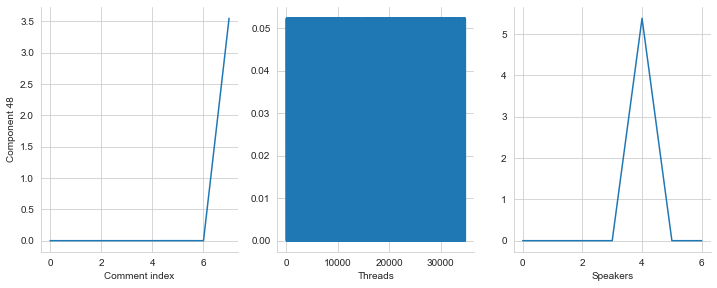

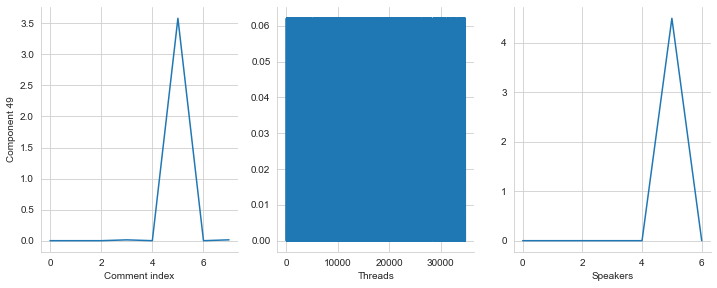

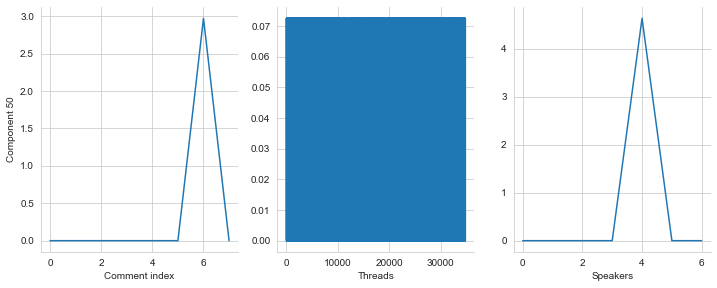

In [424]:
td.summarize(corpus, axis_names=['Comment index', 'Threads', 'Speakers'], 
             output_dir='convokit/tensor_decomposer/reports/coarse-discourse', 
             report_title='Coarse discourse', 
             liwc=True)

In [425]:
for utt in corpus.iter_utterances(lambda u: u.meta['valid']):
    path = []
    for i in range(1, LENGTH+1):
        for k, v in utt.meta[f'speaker-dict-{i}'].items():
            if v == 1:
                path.append(k)
                break
    utt.meta['path'] = ''.join([n.split(' ')[0].ljust(9, ' ') for n in path])

In [426]:
utt.meta['path']

'Phoebe   other    Joey     other    Joey     other    other    other    '

In [427]:
df = corpus.get_utterances_dataframe(lambda u: u.meta['valid'])

In [428]:
from sklearn.preprocessing import Normalizer, StandardScaler
from sklearn.decomposition import TruncatedSVD
from sklearn.manifold import TSNE
from sklearn.metrics.pairwise import pairwise_distances

from sklearn.manifold import TSNE
tsne = TSNE(random_state=2000, verbose=1)

In [429]:
print(td.factors[1].shape)
projected_threads = tsne.fit_transform(td.factors[1])
print(projected_threads.shape)

xs = [x for (x, y) in projected_threads]
ys = [y for (x, y) in projected_threads]

df['x'] = xs
df['y'] = ys

(34817, 50)
[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 34817 samples in 0.327s...
[t-SNE] Computed neighbors for 34817 samples in 79.747s...
[t-SNE] Computed conditional probabilities for sample 1000 / 34817
[t-SNE] Computed conditional probabilities for sample 2000 / 34817
[t-SNE] Computed conditional probabilities for sample 3000 / 34817
[t-SNE] Computed conditional probabilities for sample 4000 / 34817
[t-SNE] Computed conditional probabilities for sample 5000 / 34817
[t-SNE] Computed conditional probabilities for sample 6000 / 34817
[t-SNE] Computed conditional probabilities for sample 7000 / 34817
[t-SNE] Computed conditional probabilities for sample 8000 / 34817
[t-SNE] Computed conditional probabilities for sample 9000 / 34817
[t-SNE] Computed conditional probabilities for sample 10000 / 34817
[t-SNE] Computed conditional probabilities for sample 11000 / 34817
[t-SNE] Computed conditional probabilities for sample 12000 / 34817
[t-SNE] Computed conditional probabil

In [414]:
import plotly.express as px
fig = px.scatter(df, x='x', y='y', hover_data=['meta.path'])
fig.show()

In [430]:
from sklearn.cluster import KMeans
from sklearn.neighbors import NearestNeighbors

kmeans = KMeans(n_clusters=20)
X = td.factors[1]
kmeans.fit(X)

knn = NearestNeighbors(n_neighbors=10)
knn.fit(X)

NearestNeighbors(algorithm='auto', leaf_size=30, metric='minkowski',
                 metric_params=None, n_jobs=None, n_neighbors=10, p=2,
                 radius=1.0)

In [431]:
utts = list(corpus.iter_utterances(lambda u: u.meta['valid']))

In [432]:
for idx, cluster_pt in enumerate(kmeans.cluster_centers_, start=1):
    print(f"Cluster {idx}")
    for i in knn.kneighbors([cluster_pt], return_distance=False)[0]:
        print(utts[i].meta['path'], end=" ")
        print()
    print()

Cluster 1
Ross     Monica   Joey     other    Joey     Chandler Ross     Joey      
Ross     Chandler Joey     Ross     Joey     Joey     Ross     Joey      
Ross     Monica   Joey     Chandler Ross     Joey     Ross     Joey      
Joey     Ross     Monica   Ross     Chandler Joey     Ross     Joey      
Joey     Ross     Monica   Rachel   Joey     Chandler Ross     Rachel    
Joey     Ross     Monica   Ross     Chandler Monica   Ross     Joey      
Ross     Chandler Joey     Chandler Chandler Joey     Ross     Joey      
Joey     Chandler Monica   Chandler Joey     Chandler Ross     Rachel    
Ross     Chandler Joey     Chandler Joey     Chandler Ross     Joey      
Ross     Chandler Joey     Chandler Joey     Chandler Ross     Rachel    

Cluster 2
Rachel   Ross     Rachel   Ross     Rachel   Ross     Rachel   Ross      
Rachel   Ross     Rachel   Ross     Rachel   Ross     Rachel   Ross      
Rachel   Ross     Rachel   Ross     Rachel   Ross     Rachel   Ross      
Rachel   Ross    

In [ ]:

for convo in corpus.iter_conversations():
    

In [12]:
corpus.random_conversation().print_conversation_structure(lambda utt: utt.text)


    Hey! We're here!
        Hey!
            Ohh! Oh my God!
                You like it?
                    Oh no!
                        It's my new apothecary table!
                            Ross! Phoebe's gonna be here any second, she cannot see this!
                                Well why not?! She'll-she'll love it! It's the real thing! I got it at Pottery Barn.
                                    I know you did! I bought the same one! And if she sees your table she's gonna know that I lied to her. I told her ours was an original.
                                        Why did you do that?
                                            Because she hates Pottery Barn.
                                                She hates Pottery Barn?!!
                                                    I know! I know, she says it's all mass-produced, nothing is authentic, and everyone winds up having the same stuff. So come on, she's gonna be here any second! Can we please just cover 